# 🐶 Image Classification of Different Dog Breeds Using Transfer Learning

In this project machine learning its used to identify different breeds of dogs.

The data its obtained from [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/overview). It consists of a collection of 10,000+ labelled images of 120 different dog breeds.

This problem is called multi-class image classification. And this will be the workflow:
1. Get data ready.
2. Prepare the data (preprocessing, the 3 sets, X & y).
3. Choose and fit/train a model ([TensorFlow Hub](https://www.tensorflow.org/hub), `tf.keras.applications`, [TensorBoard](https://www.tensorflow.org/tensorboard), [EarlyStopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)).
4. Evaluating the model.
5. Improve the model through experimentation.
6. Save, share and reload the model.

For preprocessing the data I'll use TensorFlow 2.x. The goal is to get the data into Tensors and then allow a machine learning model to find patterns between them.

For the machine learning model, a pretrained deep learning model from TensorFlow Hub will be used.

## Getting the workspace ready

In [ ]:
!unzip "drive/MyDrive/Colab Notebooks/dog-breed-identification (1).zip" -d "drive/MyDrive/Colab Notebooks"

Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: drive/MyDrive/Colab Notebooks/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Colab Notebooks/train/8403

In [1]:
import tensorflow as tf
print('TF version', tf.__version__)

TF version 2.15.0


In [2]:
import tensorflow as tf
import tensorflow_hub as hub

print('TF version', tf.__version__)
print('Hub version:', hub.__version__)
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

TF version 2.15.0
Hub version: 0.16.1
GPU available


## Accessing the data
Let's start with labels.csv which contains all of the image ID's and their assosciated dog breed.

In [3]:
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Colab Notebooks/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


There are 10222 different ID's (10222 different images) and 120 different breeds.

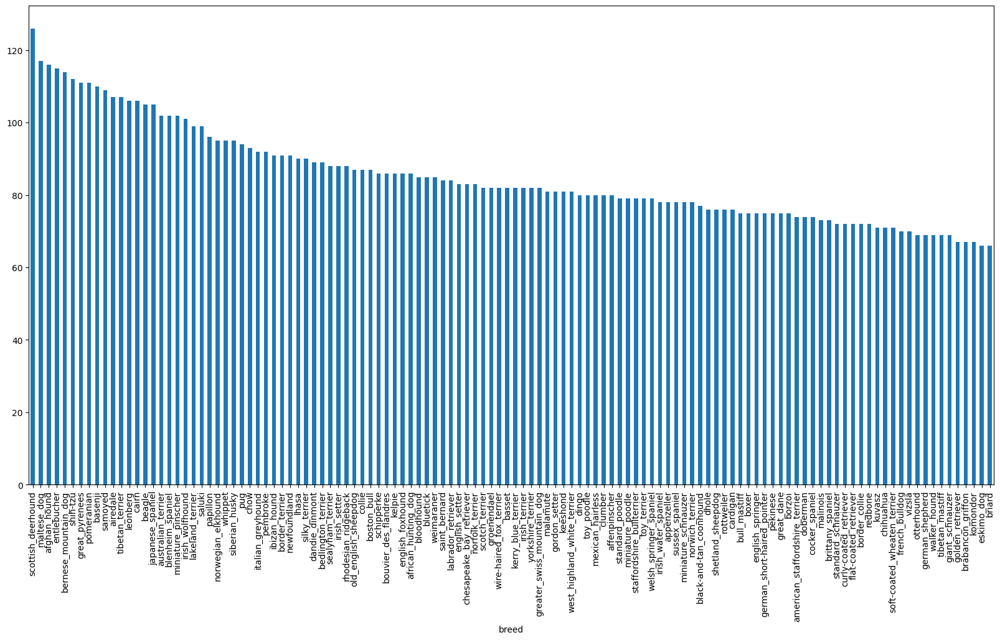

In [4]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

There's about 60+ images for each dog breed.

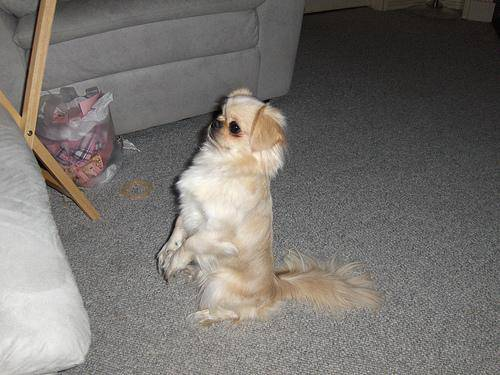

In [4]:
#Image(filepath to train folder and ID of the image I want adding .jpg at the end)
from IPython.display import display, Image
Image('drive/MyDrive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg')

## Getting images and their labels
With the image ID's and their labels in a DataFrame (labels_csv), lets create:

* A list of filepaths to training images
* An array of all labels
* An array of all unique labels

In [5]:
filenames = ['drive/MyDrive/Colab Notebooks/train/' + fname + '.jpg' for fname in labels_csv['id']]
filenames[:10]

['drive/MyDrive/Colab Notebooks/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [6]:
#Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Colab Notebooks/train')) == len(filenames):
  print('Filenames match actual amount of files')
else:
  print('Filenames do not match actual amount of files, check the target directory.')

Filenames match actual amount of files


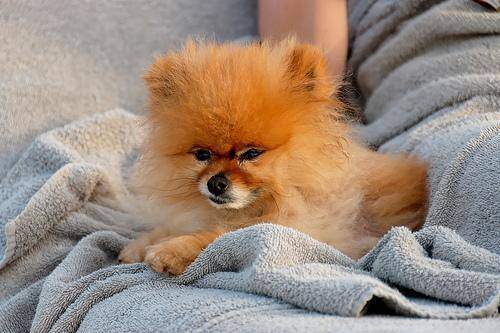

In [7]:
Image(filenames[8000])

Now let's take the labels from labels_csv and turn them into a NumPy array.

In [8]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [9]:
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames.')
else:
    print('Number of labels does not match number of filenames, check data directories')

Number of labels matches number of filenames.


Now its necessary to convert labels to numbers. First lets find all of the unique dog breed names. Then go through the list of labels and compare them to unique breeds and create a list of booleans indicating which one is the real label and which ones aren't.

In [10]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

There are 120 different breeds of dogs. Now I will turn the labels array into an array of booleans.

In [11]:
# Example: Turn one label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [12]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Creating the validation set

In [13]:
x = filenames
y = boolean_labels

Let's start experimenting with 1000 images and increase it as needed.

In [14]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [15]:
# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [16]:
# Check out the training data (image file paths and labels)
x_train[:5], y_train[:2]

(['drive/MyDrive/Colab Notebooks/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Notebooks/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Notebooks/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

## Preprocessing images (turning images into Tensors)
The labels are in numeric format but the images are still just file paths. Since I'm using TensorFlow, the data has to be in the form of Tensors.
To preprocess the images into Tensors lets write a function which does a few things:

* Takes an image filename as input.
* Uses TensorFlow to read the file and save it to a variable, image.
* Turn our image (a jpeg file) into Tensors.
* Resize the image to be of shape (224, 224).
* Return the modified image.

In [17]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) # read in an image
image.shape

(257, 350, 3)

The shape of the image it's (257, 350, 3). It can be easily converted to a Tensor using tf.constant().

In [18]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [19]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Creating data batches
Now lets build a function to turn the data into batches, more specifically, a TensorFlow Batch Dataset.

In [20]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label


This function turns the image file path names and their associated labels into tuples (we can turn these into Tensors next).
Now I'll create a function to make data batches.
Because there are 3 different sets of data (training, validation and test), the function should accomodate for each set.

In [21]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch
# Create training and validation data batches

In [22]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [23]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches



In [24]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

A batch is a collection of Tensors.

To view data in a batch I call as_numpy_iterator() method on a data batch.

This will turn THE data batch into something which can be iterated over.

Passing an iterable to next() will return the next item in the iterator.

In this case, next will return a batch of 32 images and label pairs.

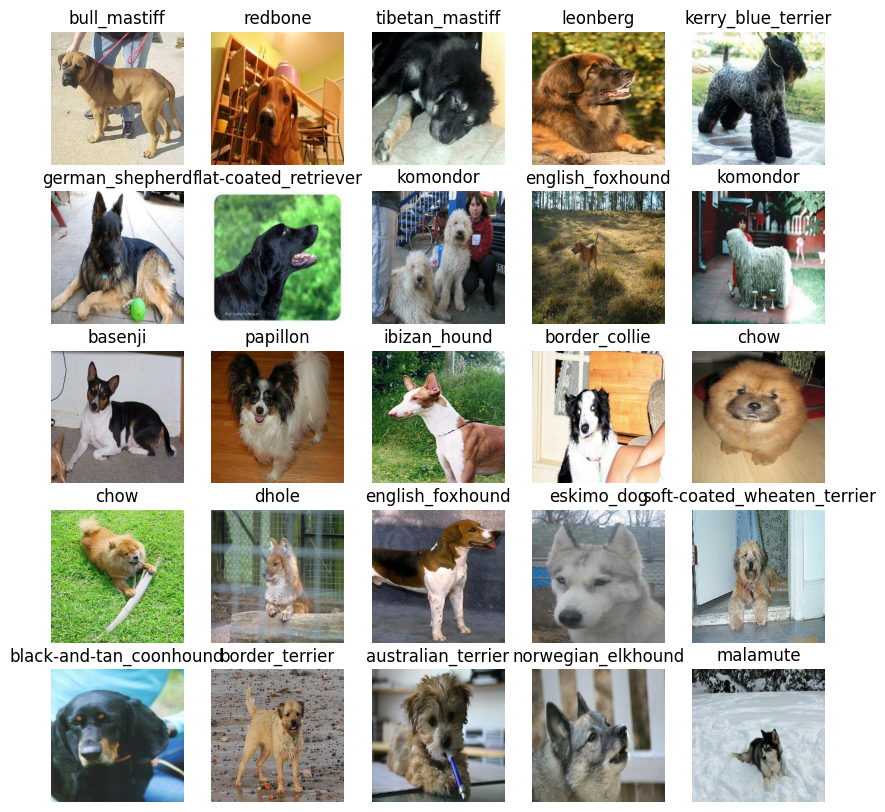

In [26]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

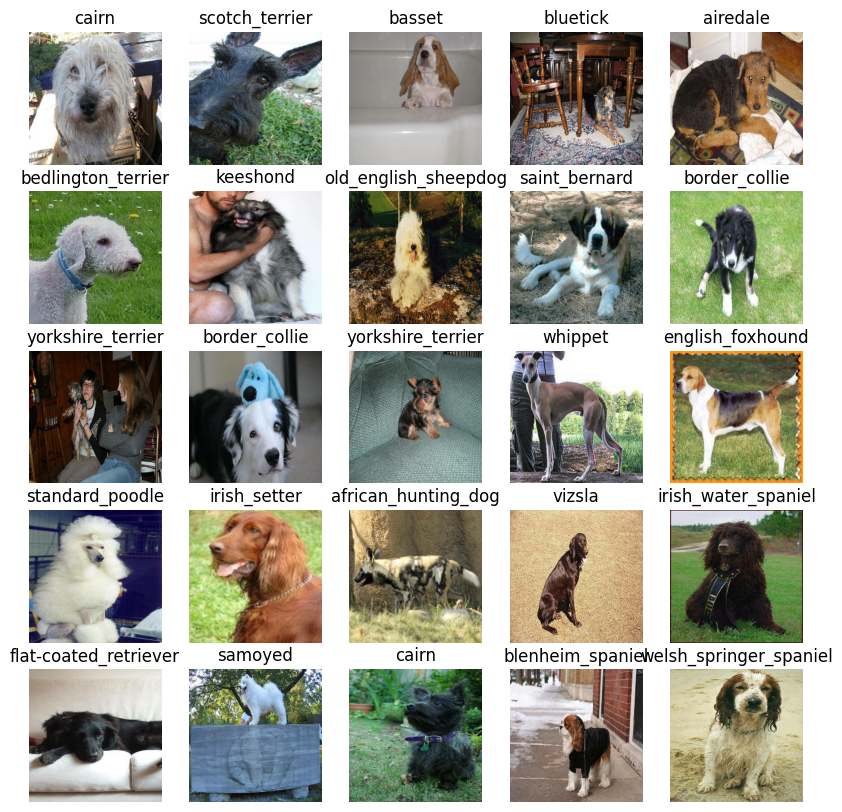

In [27]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Creating and training the model
I'll use an existing model from TensorFlow Hub. TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on.

## Building the model
Before I build the model, there are a few things I'll define:

* The input shape (images, in the form of Tensors) to the model.
* The output shape (image labels, in the form of Tensors) of the model.
* The URL of the model I want to use.

In [25]:
# Setup input and output shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels.
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Let's create a function which:

* Takes the input shape, output shape and the model's URL as parameters.
* Defines the layers in a Keras model in a sequential fashion.
* Compiles the model (says how it should be evaluated and improved).
* Builds the model.
* Returns the model.


In [26]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # the model wants to reduce this.
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_5 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_5 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Setting up the model layers
There are two ways to do this in Keras, the functional and sequential API. I've used the sequential.

The first layer I use is the model from TensorFlow Hub (hub.KerasLayer(MODEL_URL). This input layer takes in the images and finds patterns in them based on the patterns mobilenet_v2_130_224 has found.

The next layer (tf.keras.layers.Dense()) is the output layer of the model. It brings all of the information discovered in the input layer together and outputs it in the shape 120 (the number of unique labels).

The activation="softmax" parameter tells the output layer to assign a probability value to each of the labels.
## Compiling the model

model.compile():

loss - the loss function, the models goal is to minimize this, getting to 0 means the model is learning perfectly.

optimizer - The Adam optimizer gives the accuracy of how well the model is predicting the correct image label.

## Building the model
Tells the model what input shape it can expect.

In this case, the input shape is [None, IMG_SIZE, IMG_SIZE, 3] or [None, 224, 224, 3] or [batch_size, img_height, img_width, color_channels].

Batch size is left as None as this is inferred from the data I pass the model. In this case, it'll be 32.

In [27]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


The non-trainable parameters are the patterns learned by mobilenet_v2_130_224 and the trainable parameters are the ones in the dense layer added.

# Creating callbacks

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks are a TensorBoard callback and an Early Stopping callback.
TensorBoard helps provide a visual way to monitor the progress of the model during and after training.


In [28]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [29]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensor_board_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Colab Notebooks',
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early Stopping Callback
Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving.

In [30]:
# Create early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3) # stops after 3 rounds of no improvements

# Training a model (on a subset of data)
The first model is going to be trained on 1000 images, about 10% of the total data.

Another parameter to define is NUM_EPOCHS (number of epochs).

NUM_EPOCHS defines how many passes of the data I'd like the model to do. Having early stopping setup means if I set NUM_EPOCHS to 100 but the model stops improving after 22 epochs, it'll stop training.

In [31]:
print('GPU is available' if tf.config.list_physical_devices('GPU') else 'GPU is not available')

GPU is available


In [32]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}


Now I'll create a function which trains the model. The function will:

Create a model using create_model().

Setup a TensorBoard callback.

Call the fit() function on the model passing it the training data, validatation data, number of epochs to train for and the callbacks to use.

Return the fitted model.

In [33]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  model = create_model()    # Create a model
  tensorboard = create_tensor_board_callback()   # Create new TensorBoard session everytime I train a model
  model.fit(x=train_data,   # Fit the model to the data passing it the callbacks created
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping]
            )
  return model

In [34]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 185s 7s/step - loss: 4.5824 - accuracy: 0.1025 - val_loss: 3.4488 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 5s 207ms/step - loss: 1.6336 - accuracy: 0.6850 - val_loss: 2.2404 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 5s 185ms/step - loss: 0.5745 - accuracy: 0.9212 - val_loss: 1.7192 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 5s 204ms/step - loss: 0.2572 - accuracy: 0.9887 - val_loss: 1.5194 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 169ms/step - loss: 0.1467 - accuracy: 0.9987 - val_loss: 1.4421 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 5s 181ms/step - loss: 0.1019 - accuracy: 0.9987 - val_loss: 1.3872 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

Checking the TensorBoard logs
Now the model has been trained, I will check the TensorBoard logs.

The TensorBoard magic function (%tensorboard) will access the logs directory created earlier and viualize its contents.

In [40]:
%tensorboard --logdir "/content/drive/MyDrive/Colab Notebooks/samples/20240526-011527"

<IPython.core.display.Javascript object>

The model stopped training after 18 epoch. The validation accuracy got to 69% in a few minutes. This means, if we were to scale up the number of images, hopefully the accuracy would increase.

# Making and evaluating predictions

In [41]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 116ms/step


array([[2.8819824e-03, 1.6106707e-05, 6.9571921e-04, ..., 5.4729153e-05,
        1.3425956e-05, 2.9542979e-03],
       [8.3500985e-03, 4.9604184e-04, 1.9503778e-02, ..., 5.8717665e-04,
        4.3194857e-03, 4.6716443e-05],
       [7.1969230e-06, 1.6437465e-05, 3.4665423e-05, ..., 3.6775589e-05,
        1.5308331e-05, 5.8303893e-05],
       ...,
       [3.1261520e-06, 1.6812979e-05, 5.9634986e-05, ..., 5.3556137e-06,
        1.2120062e-04, 3.0736803e-05],
       [1.6297161e-03, 1.0754388e-04, 7.1585506e-05, ..., 7.4374570e-05,
        4.3567754e-05, 4.4304393e-03],
       [1.2866975e-04, 3.0911207e-05, 1.2286616e-04, ..., 2.7976101e-03,
        1.8566033e-03, 1.7821581e-04]], dtype=float32)

In [42]:
predictions.shape

(200, 120)

Making predictions with the model returns an array with a different value for each label. Making predictions on the validation data (200 images) returns an array (predictions) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Now I'll convert an array of probabilities into a label.

In [43]:
# first prediction
print(predictions[0])
print(f'Max value (probability of prediction): {np.max(predictions[0])}') # the max probability value predicted by the model
print(f'Sum: {np.sum(predictions[0])}') # This will be close to 1
print(f'Max index: {np.argmax(predictions[0])}') # the index of where the max value in predictions[0] occurs
print(f'Predicted label: {unique_breeds[np.argmax(predictions[0])]}')

[2.88198236e-03 1.61067073e-05 6.95719209e-04 2.16018234e-05
 6.19645580e-04 3.99376186e-05 5.53769805e-03 2.97357707e-04
 7.53285567e-05 8.99662409e-05 5.15076099e-04 2.98800223e-05
 4.56353446e-04 2.57534120e-04 6.29693823e-05 3.62244580e-04
 5.38588756e-05 4.37766686e-02 5.44114882e-05 2.84586331e-05
 7.89533311e-04 1.04609178e-04 1.59026422e-05 4.36749571e-04
 5.07381810e-05 6.51343798e-05 4.11626488e-01 3.25319452e-05
 2.25058480e-04 2.29829529e-04 6.30637369e-05 4.50184569e-04
 5.67296775e-05 2.32503971e-05 7.21330289e-05 3.00433356e-02
 2.00573031e-05 1.18003998e-04 6.81089296e-05 1.65273479e-04
 6.52897113e-04 5.78705067e-06 6.77275921e-06 1.75919035e-04
 4.54646251e-05 4.94176929e-05 8.15045587e-06 4.79818518e-05
 6.75781688e-04 8.95978883e-05 4.68541344e-04 4.77973408e-05
 4.43713448e-04 4.30005639e-05 4.00753161e-05 6.54696778e-05
 1.51671353e-04 1.30405221e-02 6.71978050e-05 1.63613603e-01
 7.70725019e-05 3.43843953e-06 7.88595993e-04 2.74094987e-06
 7.12467707e-04 3.727046

Now I'll build a function to convert confidence levels into predicted labels.

In [44]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Now I've got a list of all different predictions the model has made, I'll do the same for the validation images and validation labels.

Since the validation data is in batch form, to get a list of validation images and labels, I'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

In [56]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels
# Unbatch the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Lets create a function to view an image, its predicted label and its actual label.

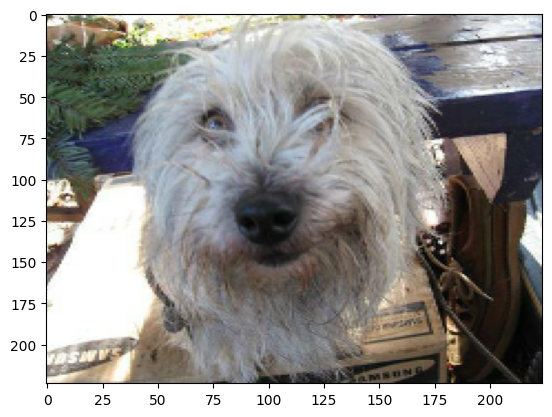

In [57]:
plt.imshow(val_images[0], aspect="auto")

In [58]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

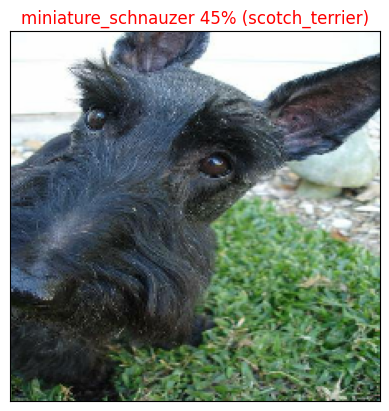

In [59]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

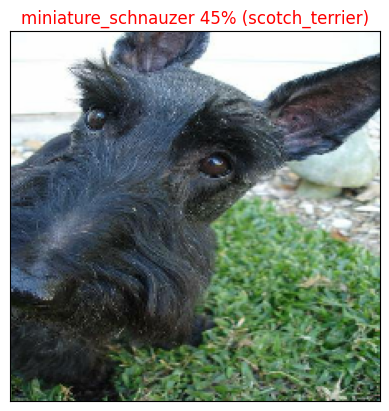

In [60]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [61]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

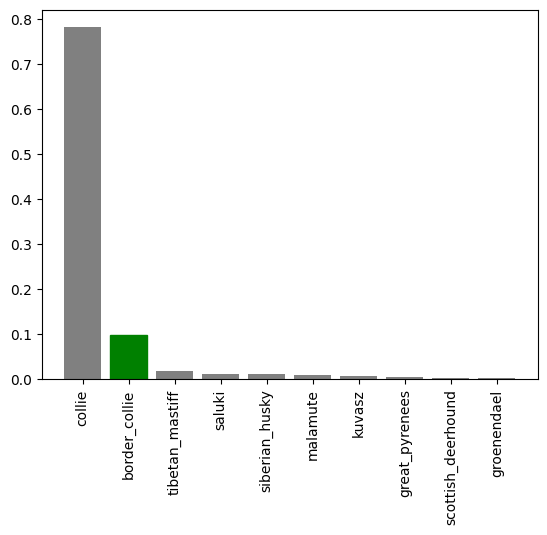

In [62]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

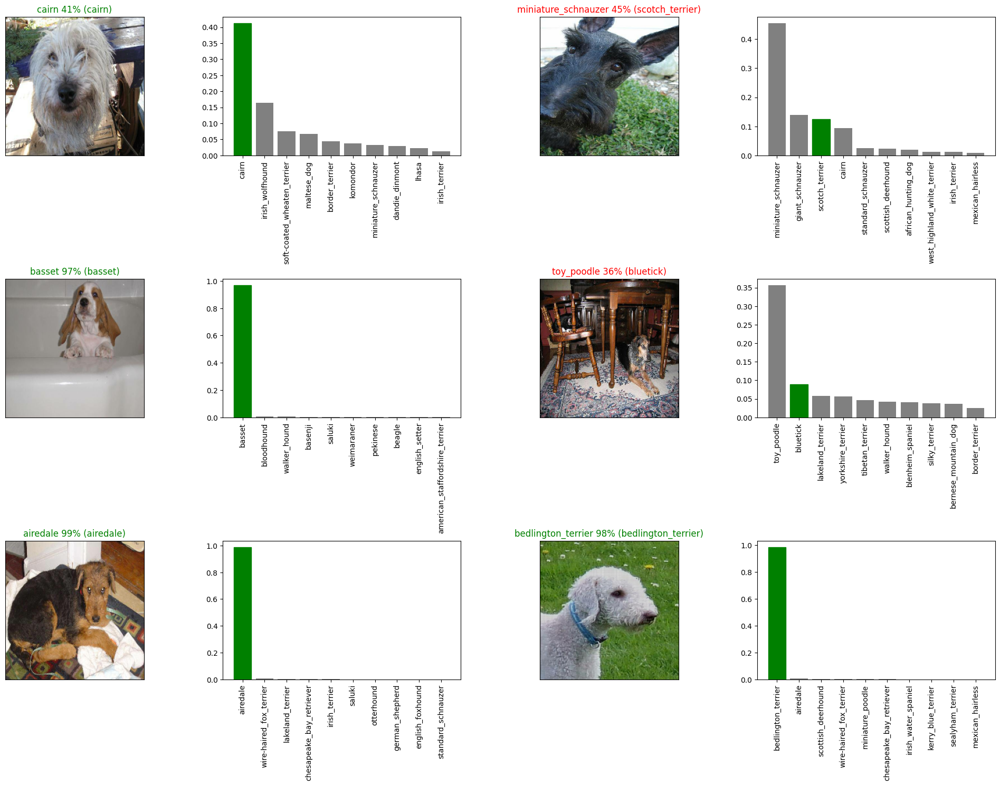

In [63]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Conclusion

The project "Image Classification of Different Dog Breeds Using Transfer Learning" has achieved remarkable success in accurately predicting dog breeds from images. Leveraging machine learning techniques, especially transfer learning, yielded promising outcomes.

Through structured experimentation, I successfully trained a model that demonstrated favorable accuracy. With the potential for further improvement by increasing the training data volume, initial results are encouraging.

Moving forward, the model's performance can be enhanced through continued experimentation and fine-tuning.


# Author: Camila Silveira
## Creation Date: September 2023